# Loading dataset


In [1]:
import torch.nn as nn
import os
from PIL import Image
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
import random
import matplotlib.pyplot as plt
pip install torch torchvision
import torch.nn as nn
import torchvision.models
import collections
import math
import torch.nn.functional as F
import shutil
import time
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import timm


In [2]:
class DepthDataset(Dataset):
    def __init__(self, folder_path, transform=None, target_transform=None):
        self.image_paths = []
        self.depth_paths = []
        self.transform = transform  
        self.target_transform = target_transform  # Transformation to be applied to the depth maps
        for root, _, files in os.walk(folder_path):
            depth_filenames = {}
            for filename in files:
                if filename.startswith('d-') and filename.endswith('.pgm'):
                    unique_id = filename.split('-')[1][:10]
                    depth_filenames[unique_id] = filename

            for filename in files:
                if filename.startswith('r-') and filename.endswith('.ppm'):
                    unique_id = filename.split('-')[1][:10]
                    rgb_path = os.path.join(root, filename)
                    matching_depth_filename = depth_filenames.get(unique_id)
                    if matching_depth_filename:
                        depth_path = os.path.join(root, matching_depth_filename)
                        self.image_paths.append(rgb_path)
                        self.depth_paths.append(depth_path)
                    else:
                        print(f"Warning: Depth map not found for RGB image {filename} in {root}")

    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        try:
            rgb_image = Image.open(self.image_paths[idx])
            depth_image = Image.open(self.depth_paths[idx])
            if self.transform:
                rgb_image = self.transform(rgb_image)
            if hasattr(self, 'target_transform') and self.target_transform:
                depth_image = self.target_transform(depth_image)
            else:
                depth_image = transforms.ToTensor()(depth_image)
            depth_image = depth_image.type(torch.float32)

            return rgb_image, depth_image

        except OSError as e:
            print(f"Skipping file {self.image_paths[idx]} or {self.depth_paths[idx]} due to error: {e}")
            if idx + 1 < len(self):
                return self.__getitem__(idx + 1)
            else:
                return self.__getitem__(0)


base_path = '/kaggle/input/thesis-final-nyu-depth'
image_transform = transforms.Compose([
    transforms.Resize((224, 224)),  
    transforms.ToTensor(),  # Convert images to PyTorch tensors
])

target_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

dataset = DepthDataset(base_path, transform=image_transform, target_transform=target_transform)
seed = 42
torch.manual_seed(seed)
random.seed(seed)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)


In [3]:
train_size = len(train_dataset)
test_size = len(test_dataset)

print(f"Number of images in the training set: {train_size}")
print(f"Number of images in the testing set: {test_size}")

Number of images in the training set: 21121
Number of images in the testing set: 5281


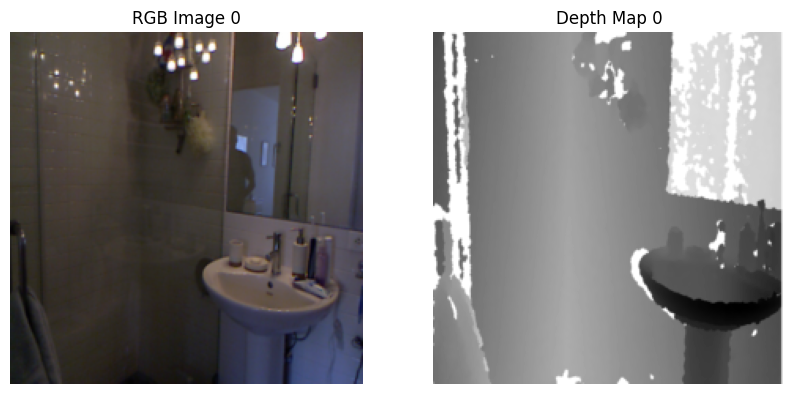

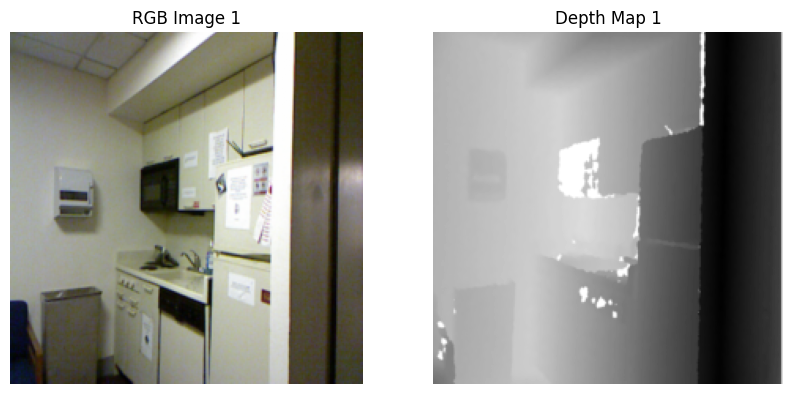

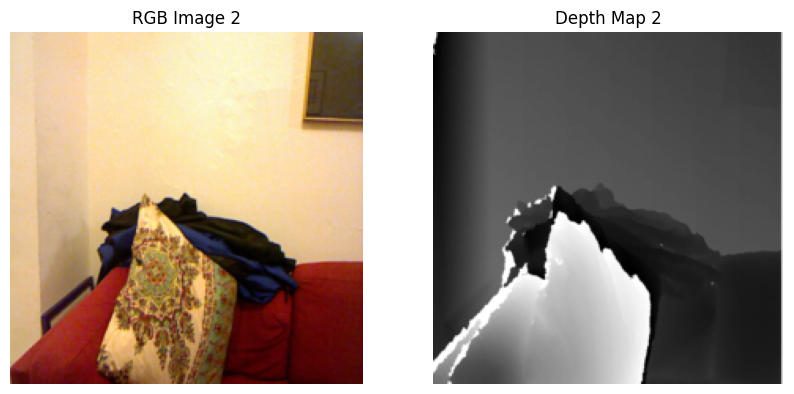

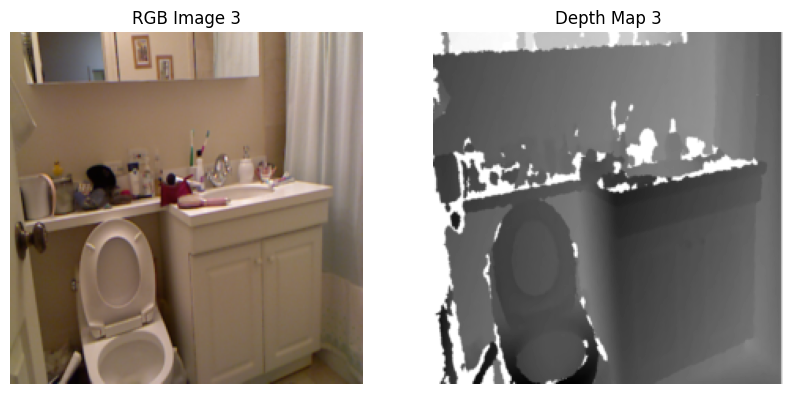

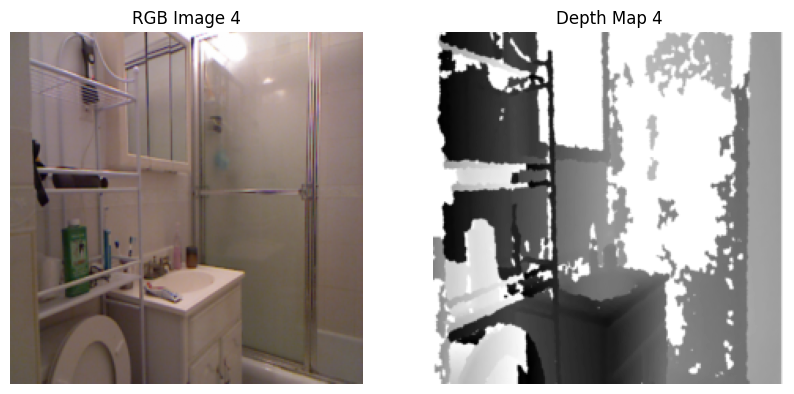

In [4]:
import matplotlib.pyplot as plt
def plot_rgb_and_depth(rgb_image, depth_map, index):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(rgb_image.permute(1, 2, 0)) 
    axes[0].set_title(f"RGB Image {index}")
    axes[0].axis('off')
    depth_map = depth_map.squeeze(0)  # Remove the channel dimension for grayscale image
    axes[1].imshow(depth_map, cmap='gray')
    axes[1].set_title(f"Depth Map {index}")
    axes[1].axis('off')
    plt.show()

num_samples_to_plot = 5
indices = torch.randint(0, len(test_dataset), (num_samples_to_plot,))
for i, index in enumerate(indices):
    rgb_image, depth_map = test_dataset[index]
    plot_rgb_and_depth(rgb_image, depth_map, i)


# Fast Net Initialisation

In [4]:
# This cell contains the original FastDepth's architecture founc=d from the author's github repository
class MobileNet(nn.Module):
    def __init__(self, relu6=True):
        super(MobileNet, self).__init__()

        def relu(relu6):
            if relu6:
                return nn.ReLU6(inplace=True)
            else:
                return nn.ReLU(inplace=True)

        def conv_bn(inp, oup, stride, relu6):
            return nn.Sequential(
                nn.Conv2d(inp, oup, 3, stride, 1, bias=False),
                nn.BatchNorm2d(oup),
                relu(relu6),
            )

        def conv_dw(inp, oup, stride, relu6):
            return nn.Sequential(
                nn.Conv2d(inp, inp, 3, stride, 1, groups=inp, bias=False),
                nn.BatchNorm2d(inp),
                relu(relu6),
    
                nn.Conv2d(inp, oup, 1, 1, 0, bias=False),
                nn.BatchNorm2d(oup),
                relu(relu6),
            )

        self.model = nn.Sequential(
            conv_bn(  3,  32, 2, relu6), 
            conv_dw( 32,  64, 1, relu6),
            conv_dw( 64, 128, 2, relu6),
            conv_dw(128, 128, 1, relu6),
            conv_dw(128, 256, 2, relu6),
            conv_dw(256, 256, 1, relu6),
            conv_dw(256, 512, 2, relu6),
            conv_dw(512, 512, 1, relu6),
            conv_dw(512, 512, 1, relu6),
            conv_dw(512, 512, 1, relu6),
            conv_dw(512, 512, 1, relu6),
            conv_dw(512, 512, 1, relu6),
            conv_dw(512, 1024, 2, relu6),
            conv_dw(1024, 1024, 1, relu6),
            nn.AvgPool2d(7),
        )
        self.fc = nn.Linear(1024, 1000)

    def forward(self, x):
        x = self.model(x)
        x = x.view(-1, 1024)
        x = self.fc(x)
        return x

def main():
    import torchvision.models
    model = MobileNet(relu6=True)
    model = torch.nn.DataParallel(model).cuda()
    model_filename = os.path.join('results', 'imagenet.arch=mobilenet.lr=0.1.bs=256', 'model_best.pth.tar')
    if os.path.isfile(model_filename):
        print("=> loading Imagenet pretrained model '{}'".format(model_filename))
        checkpoint = torch.load(model_filename)
        epoch = checkpoint['epoch']
        best_prec1 = checkpoint['best_prec1']
        model.load_state_dict(checkpoint['state_dict'])
        print("=> loaded Imagenet pretrained model '{}' (epoch {}). best_prec1={}".format(model_filename, epoch, best_prec1))

if __name__ == '__main__':
    main()

# -------------------------------------------------------------------------------------------------------------------------

class Identity(nn.Module):
    # a dummy identity module
    def __init__(self):
        super(Identity, self).__init__()

    def forward(self, x):
        return x

class Unpool(nn.Module):
    # Unpool: 2*2 unpooling with zero padding
    def __init__(self, stride=2):
        super(Unpool, self).__init__()

        self.stride = stride

        # create kernel [1, 0; 0, 0]
        self.mask = torch.zeros(1, 1, stride, stride)
        self.mask[:,:,0,0] = 1

    def forward(self, x):
        assert x.dim() == 4
        num_channels = x.size(1)
        return F.conv_transpose2d(x,
            self.mask.detach().type_as(x).expand(num_channels, 1, -1, -1),
            stride=self.stride, groups=num_channels)

def weights_init(m):
    # Initialize kernel weights with Gaussian distributions
    if isinstance(m, nn.Conv2d):
        n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
        m.weight.data.normal_(0, math.sqrt(2. / n))
        if m.bias is not None:
            m.bias.data.zero_()
    elif isinstance(m, nn.ConvTranspose2d):
        n = m.kernel_size[0] * m.kernel_size[1] * m.in_channels
        m.weight.data.normal_(0, math.sqrt(2. / n))
        if m.bias is not None:
            m.bias.data.zero_()
    elif isinstance(m, nn.BatchNorm2d):
        m.weight.data.fill_(1)
        m.bias.data.zero_()

def conv(in_channels, out_channels, kernel_size):
    padding = (kernel_size-1) // 2
    assert 2*padding == kernel_size-1, "parameters incorrect. kernel={}, padding={}".format(kernel_size, padding)
    return nn.Sequential(
          nn.Conv2d(in_channels,out_channels,kernel_size,stride=1,padding=padding,bias=False),
          nn.BatchNorm2d(out_channels),
          nn.ReLU(inplace=True),
        )

def depthwise(in_channels, kernel_size):
    padding = (kernel_size-1) // 2
    assert 2*padding == kernel_size-1, "parameters incorrect. kernel={}, padding={}".format(kernel_size, padding)
    return nn.Sequential(
          nn.Conv2d(in_channels,in_channels,kernel_size,stride=1,padding=padding,bias=False,groups=in_channels),
          nn.BatchNorm2d(in_channels),
          nn.ReLU(inplace=True),
        )

def pointwise(in_channels, out_channels):
    return nn.Sequential(
          nn.Conv2d(in_channels,out_channels,1,1,0,bias=False),
          nn.BatchNorm2d(out_channels),
          nn.ReLU(inplace=True),
        )

def convt(in_channels, out_channels, kernel_size):
    stride = 2
    padding = (kernel_size - 1) // 2
    output_padding = kernel_size % 2
    assert -2 - 2*padding + kernel_size + output_padding == 0, "deconv parameters incorrect"
    return nn.Sequential(
            nn.ConvTranspose2d(in_channels,out_channels,kernel_size,
                stride,padding,output_padding,bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

def convt_dw(channels, kernel_size):
    stride = 2
    padding = (kernel_size - 1) // 2
    output_padding = kernel_size % 2
    assert -2 - 2*padding + kernel_size + output_padding == 0, "deconv parameters incorrect"
    return nn.Sequential(
            nn.ConvTranspose2d(channels,channels,kernel_size,
                stride,padding,output_padding,bias=False,groups=channels),
            nn.BatchNorm2d(channels),
            nn.ReLU(inplace=True),
        )

def upconv(in_channels, out_channels):
    return nn.Sequential(
        Unpool(2),
        nn.Conv2d(in_channels,out_channels,kernel_size=5,stride=1,padding=2,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(),
    )

class upproj(nn.Module):
    # UpProj module has two branches, with a Unpool at the start and a ReLu at the end
    #   upper branch: 5*5 conv -> batchnorm -> ReLU -> 3*3 conv -> batchnorm
    #   bottom branch: 5*5 conv -> batchnorm

    def __init__(self, in_channels, out_channels):
        super(upproj, self).__init__()
        self.unpool = Unpool(2)
        self.branch1 = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size=5,stride=1,padding=2,bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels,out_channels,kernel_size=3,stride=1,padding=1,bias=False),
            nn.BatchNorm2d(out_channels),
        )
        self.branch2 = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size=5,stride=1,padding=2,bias=False),
            nn.BatchNorm2d(out_channels),
        )

    def forward(self, x):
        x = self.unpool(x)
        x1 = self.branch1(x)
        x2 = self.branch2(x)
        return F.relu(x1 + x2)

class Decoder(nn.Module):
    names = ['deconv{}{}'.format(i,dw) for i in range(3,10,2) for dw in ['', 'dw']]
    names.append("upconv")
    names.append("upproj")
    for i in range(3,10,2):
        for dw in ['', 'dw']:
            names.append("nnconv{}{}".format(i, dw))
            names.append("blconv{}{}".format(i, dw))
            names.append("shuffle{}{}".format(i, dw))

class DeConv(nn.Module):

    def __init__(self, kernel_size, dw):
        super(DeConv, self).__init__()
        if dw:
            self.convt1 = nn.Sequential(
                convt_dw(1024, kernel_size),
                pointwise(1024, 512))
            self.convt2 = nn.Sequential(
                convt_dw(512, kernel_size),
                pointwise(512, 256))
            self.convt3 = nn.Sequential(
                convt_dw(256, kernel_size),
                pointwise(256, 128))
            self.convt4 = nn.Sequential(
                convt_dw(128, kernel_size),
                pointwise(128, 64))
            self.convt5 = nn.Sequential(
                convt_dw(64, kernel_size),
                pointwise(64, 32))
        else:
            self.convt1 = convt(1024, 512, kernel_size)
            self.convt2 = convt(512, 256, kernel_size)
            self.convt3 = convt(256, 128, kernel_size)
            self.convt4 = convt(128, 64, kernel_size)
            self.convt5 = convt(64, 32, kernel_size)
        self.convf = pointwise(32, 1)

    def forward(self, x):
        x = self.convt1(x)
        x = self.convt2(x)
        x = self.convt3(x)
        x = self.convt4(x)
        x = self.convt5(x)
        x = self.convf(x)
        return x


class UpConv(nn.Module):

    def __init__(self):
        super(UpConv, self).__init__()
        self.upconv1 = upconv(1024, 512)
        self.upconv2 = upconv(512, 256)
        self.upconv3 = upconv(256, 128)
        self.upconv4 = upconv(128, 64)
        self.upconv5 = upconv(64, 32)
        self.convf = pointwise(32, 1)

    def forward(self, x):
        x = self.upconv1(x)
        x = self.upconv2(x)
        x = self.upconv3(x)
        x = self.upconv4(x)
        x = self.upconv5(x)
        x = self.convf(x)
        return x

class UpProj(nn.Module):
    # UpProj decoder consists of 4 upproj modules with decreasing number of channels and increasing feature map size

    def __init__(self):
        super(UpProj, self).__init__()
        self.upproj1 = upproj(1024, 512)
        self.upproj2 = upproj(512, 256)
        self.upproj3 = upproj(256, 128)
        self.upproj4 = upproj(128, 64)
        self.upproj5 = upproj(64, 32)
        self.convf = pointwise(32, 1)

    def forward(self, x):
        x = self.upproj1(x)
        x = self.upproj2(x)
        x = self.upproj3(x)
        x = self.upproj4(x)
        x = self.upproj5(x)
        x = self.convf(x)
        return x

class NNConv(nn.Module):

    def __init__(self, kernel_size, dw):
        super(NNConv, self).__init__()
        if dw:
            self.conv1 = nn.Sequential(
                depthwise(1024, kernel_size),
                pointwise(1024, 512))
            self.conv2 = nn.Sequential(
                depthwise(512, kernel_size),
                pointwise(512, 256))
            self.conv3 = nn.Sequential(
                depthwise(256, kernel_size),
                pointwise(256, 128))
            self.conv4 = nn.Sequential(
                depthwise(128, kernel_size),
                pointwise(128, 64))
            self.conv5 = nn.Sequential(
                depthwise(64, kernel_size),
                pointwise(64, 32))
            self.conv6 = pointwise(32, 1)
        else:
            self.conv1 = conv(1024, 512, kernel_size)
            self.conv2 = conv(512, 256, kernel_size)
            self.conv3 = conv(256, 128, kernel_size)
            self.conv4 = conv(128, 64, kernel_size)
            self.conv5 = conv(64, 32, kernel_size)
            self.conv6 = pointwise(32, 1)

    def forward(self, x):
        x = self.conv1(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')

        x = self.conv2(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')

        x = self.conv3(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')

        x = self.conv4(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')

        x = self.conv5(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')

        x = self.conv6(x)
        return x

class BLConv(NNConv):

    def __init__(self, kernel_size, dw):
        super(BLConv, self).__init__(kernel_size, dw)

    def forward(self, x):
        x = self.conv1(x)
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)

        x = self.conv2(x)
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)

        x = self.conv3(x)
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)

        x = self.conv4(x)
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)

        x = self.conv5(x)
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)

        x = self.conv6(x)
        return x

class ShuffleConv(nn.Module):

    def __init__(self, kernel_size, dw):
        super(ShuffleConv, self).__init__()
        if dw:
            self.conv1 = nn.Sequential(
                depthwise(256, kernel_size),
                pointwise(256, 256))
            self.conv2 = nn.Sequential(
                depthwise(64, kernel_size),
                pointwise(64, 64))
            self.conv3 = nn.Sequential(
                depthwise(16, kernel_size),
                pointwise(16, 16))
            self.conv4 = nn.Sequential(
                depthwise(4, kernel_size),
                pointwise(4, 4))
        else:
            self.conv1 = conv(256, 256, kernel_size)
            self.conv2 = conv(64, 64, kernel_size)
            self.conv3 = conv(16, 16, kernel_size)
            self.conv4 = conv(4, 4, kernel_size)

    def forward(self, x):
        x = F.pixel_shuffle(x, 2)
        x = self.conv1(x)

        x = F.pixel_shuffle(x, 2)
        x = self.conv2(x)

        x = F.pixel_shuffle(x, 2)
        x = self.conv3(x)

        x = F.pixel_shuffle(x, 2)
        x = self.conv4(x)

        x = F.pixel_shuffle(x, 2)
        return x

def choose_decoder(decoder):
    depthwise = ('dw' in decoder)
    if decoder[:6] == 'deconv':
        assert len(decoder)==7 or (len(decoder)==9 and 'dw' in decoder)
        kernel_size = int(decoder[6])
        model = DeConv(kernel_size, depthwise)
    elif decoder == "upproj":
        model = UpProj()
    elif decoder == "upconv":
        model = UpConv()
    elif decoder[:7] == 'shuffle':
        assert len(decoder)==8 or (len(decoder)==10 and 'dw' in decoder)
        kernel_size = int(decoder[7])
        model = ShuffleConv(kernel_size, depthwise)
    elif decoder[:6] == 'nnconv':
        assert len(decoder)==7 or (len(decoder)==9 and 'dw' in decoder)
        kernel_size = int(decoder[6])
        model = NNConv(kernel_size, depthwise)
    elif decoder[:6] == 'blconv':
        assert len(decoder)==7 or (len(decoder)==9 and 'dw' in decoder)
        kernel_size = int(decoder[6])
        model = BLConv(kernel_size, depthwise)
    else:
        assert False, "invalid option for decoder: {}".format(decoder)
    model.apply(weights_init)
    return model


class ResNet(nn.Module):
    def __init__(self, layers, decoder, output_size, in_channels=3, pretrained=True):

        if layers not in [18, 34, 50, 101, 152]:
            raise RuntimeError('Only 18, 34, 50, 101, and 152 layer model are defined for ResNet. Got {}'.format(layers))
        
        super(ResNet, self).__init__()
        self.output_size = output_size
        pretrained_model = torchvision.models.__dict__['resnet{}'.format(layers)](pretrained=pretrained)
        if not pretrained:
            pretrained_model.apply(weights_init)
        
        if in_channels == 3:
            self.conv1 = pretrained_model._modules['conv1']
            self.bn1 = pretrained_model._modules['bn1']
        else:
            self.conv1 = nn.Conv2d(in_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
            self.bn1 = nn.BatchNorm2d(64)
            weights_init(self.conv1)
            weights_init(self.bn1)
        
        self.relu = pretrained_model._modules['relu']
        self.maxpool = pretrained_model._modules['maxpool']
        self.layer1 = pretrained_model._modules['layer1']
        self.layer2 = pretrained_model._modules['layer2']
        self.layer3 = pretrained_model._modules['layer3']
        self.layer4 = pretrained_model._modules['layer4']

        # clear memory
        del pretrained_model

        # define number of intermediate channels
        if layers <= 34:
            num_channels = 512
        elif layers >= 50:
            num_channels = 2048
        self.conv2 = nn.Conv2d(num_channels, 1024, 1)
        weights_init(self.conv2)
        self.decoder = choose_decoder(decoder)

    def forward(self, x):
        # resnet
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.conv2(x)

        # decoder
        x = self.decoder(x)

        return x

class MobileNet(nn.Module):
    def __init__(self, decoder, output_size, in_channels=3, pretrained=True):

        super(MobileNet, self).__init__()
        self.output_size = output_size
        mobilenet = MobileNet()
        if pretrained:
            pretrained_path = os.path.join('imagenet', 'results', 'imagenet.arch=mobilenet.lr=0.1.bs=256', 'model_best.pth.tar')
            checkpoint = torch.load(pretrained_path)
            state_dict = checkpoint['state_dict']

            from collections import OrderedDict
            new_state_dict = OrderedDict()
            for k, v in state_dict.items():
                name = k[7:] # remove `module.`
                new_state_dict[name] = v
            mobilenet.load_state_dict(new_state_dict)
        else:
            mobilenet.apply(weights_init)

        if in_channels == 3:
            self.mobilenet = nn.Sequential(*(mobilenet.model[i] for i in range(14)))
        else:
            def conv_bn(inp, oup, stride):
                return nn.Sequential(
                    nn.Conv2d(inp, oup, 3, stride, 1, bias=False),
                    nn.BatchNorm2d(oup),
                    nn.ReLU6(inplace=True)
                )

            self.mobilenet = nn.Sequential(
                conv_bn(in_channels,  32, 2),
                *(mobilenet.model[i] for i in range(1,14))
                )

        self.decoder = choose_decoder(decoder)

    def forward(self, x):
        x = self.mobilenet(x)
        x = self.decoder(x)
        return x

class ResNetSkipAdd(nn.Module):
    def __init__(self, layers, output_size, in_channels=3, pretrained=True):

        if layers not in [18, 34, 50, 101, 152]:
            raise RuntimeError('Only 18, 34, 50, 101, and 152 layer model are defined for ResNet. Got {}'.format(layers))
        
        super(ResNetSkipAdd, self).__init__()
        self.output_size = output_size
        pretrained_model = torchvision.models.__dict__['resnet{}'.format(layers)](pretrained=pretrained)
        if not pretrained:
            pretrained_model.apply(weights_init)
        
        if in_channels == 3:
            self.conv1 = pretrained_model._modules['conv1']
            self.bn1 = pretrained_model._modules['bn1']
        else:
            self.conv1 = nn.Conv2d(in_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
            self.bn1 = nn.BatchNorm2d(64)
            weights_init(self.conv1)
            weights_init(self.bn1)
        
        self.relu = pretrained_model._modules['relu']
        self.maxpool = pretrained_model._modules['maxpool']
        self.layer1 = pretrained_model._modules['layer1']
        self.layer2 = pretrained_model._modules['layer2']
        self.layer3 = pretrained_model._modules['layer3']
        self.layer4 = pretrained_model._modules['layer4']

        # clear memory
        del pretrained_model

        # define number of intermediate channels
        if layers <= 34:
            num_channels = 512
        elif layers >= 50:
            num_channels = 2048
        self.conv2 = nn.Conv2d(num_channels, 1024, 1)
        weights_init(self.conv2)
        
        kernel_size = 5
        self.decode_conv1 = conv(1024, 512, kernel_size)
        self.decode_conv2 = conv(512, 256, kernel_size)
        self.decode_conv3 = conv(256, 128, kernel_size)
        self.decode_conv4 = conv(128, 64, kernel_size)
        self.decode_conv5 = conv(64, 32, kernel_size)
        self.decode_conv6 = pointwise(32, 1)
        weights_init(self.decode_conv1)
        weights_init(self.decode_conv2)
        weights_init(self.decode_conv3)
        weights_init(self.decode_conv4)
        weights_init(self.decode_conv5)
        weights_init(self.decode_conv6)

    def forward(self, x):
        # resnet
        x = self.conv1(x)
        x = self.bn1(x)
        x1 = self.relu(x)
        # print("x1", x1.size())
        x2 = self.maxpool(x1)
        # print("x2", x2.size())
        x3 = self.layer1(x2)
        # print("x3", x3.size())
        x4 = self.layer2(x3)
        # print("x4", x4.size())
        x5 = self.layer3(x4)
        # print("x5", x5.size())
        x6 = self.layer4(x5)
        # print("x6", x6.size())
        x7 = self.conv2(x6)

        # decoder
        y10 = self.decode_conv1(x7)
        # print("y10", y10.size())
        y9 = F.interpolate(y10 + x6, scale_factor=2, mode='nearest')
        # print("y9", y9.size())
        y8 = self.decode_conv2(y9)
        # print("y8", y8.size())
        y7 = F.interpolate(y8 + x5, scale_factor=2, mode='nearest')
        # print("y7", y7.size())
        y6 = self.decode_conv3(y7)
        # print("y6", y6.size())
        y5 = F.interpolate(y6 + x4, scale_factor=2, mode='nearest')
        # print("y5", y5.size())
        y4 = self.decode_conv4(y5)
        # print("y4", y4.size())
        y3 = F.interpolate(y4 + x3, scale_factor=2, mode='nearest')
        # print("y3", y3.size())
        y2 = self.decode_conv5(y3 + x1)
        # print("y2", y2.size())
        y1 = F.interpolate(y2, scale_factor=2, mode='nearest')
        # print("y1", y1.size())
        y = self.decode_conv6(y1)

        return y

class ResNetSkipConcat(nn.Module):
    def __init__(self, layers, output_size, in_channels=3, pretrained=True):

        if layers not in [18, 34, 50, 101, 152]:
            raise RuntimeError('Only 18, 34, 50, 101, and 152 layer model are defined for ResNet. Got {}'.format(layers))
        
        super(ResNetSkipConcat, self).__init__()
        self.output_size = output_size
        pretrained_model = torchvision.models.__dict__['resnet{}'.format(layers)](pretrained=pretrained)
        if not pretrained:
            pretrained_model.apply(weights_init)
        
        if in_channels == 3:
            self.conv1 = pretrained_model._modules['conv1']
            self.bn1 = pretrained_model._modules['bn1']
        else:
            self.conv1 = nn.Conv2d(in_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
            self.bn1 = nn.BatchNorm2d(64)
            weights_init(self.conv1)
            weights_init(self.bn1)
        
        self.relu = pretrained_model._modules['relu']
        self.maxpool = pretrained_model._modules['maxpool']
        self.layer1 = pretrained_model._modules['layer1']
        self.layer2 = pretrained_model._modules['layer2']
        self.layer3 = pretrained_model._modules['layer3']
        self.layer4 = pretrained_model._modules['layer4']

        # clear memory
        del pretrained_model

        # define number of intermediate channels
        if layers <= 34:
            num_channels = 512
        elif layers >= 50:
            num_channels = 2048
        self.conv2 = nn.Conv2d(num_channels, 1024, 1)
        weights_init(self.conv2)
        
        kernel_size = 5
        self.decode_conv1 = conv(1024, 512, kernel_size)
        self.decode_conv2 = conv(768, 256, kernel_size)
        self.decode_conv3 = conv(384, 128, kernel_size)
        self.decode_conv4 = conv(192, 64, kernel_size)
        self.decode_conv5 = conv(128, 32, kernel_size)
        self.decode_conv6 = pointwise(32, 1)
        weights_init(self.decode_conv1)
        weights_init(self.decode_conv2)
        weights_init(self.decode_conv3)
        weights_init(self.decode_conv4)
        weights_init(self.decode_conv5)
        weights_init(self.decode_conv6)

    def forward(self, x):
        # resnet
        x = self.conv1(x)
        x = self.bn1(x)
        x1 = self.relu(x)
        # print("x1", x1.size())
        x2 = self.maxpool(x1)
        # print("x2", x2.size())
        x3 = self.layer1(x2)
        # print("x3", x3.size())
        x4 = self.layer2(x3)
        # print("x4", x4.size())
        x5 = self.layer3(x4)
        # print("x5", x5.size())
        x6 = self.layer4(x5)
        # print("x6", x6.size())
        x7 = self.conv2(x6)

        # decoder
        y10 = self.decode_conv1(x7)
        # print("y10", y10.size())
        y9 = F.interpolate(y10, scale_factor=2, mode='nearest')
        # print("y9", y9.size())
        y8 = self.decode_conv2(torch.cat((y9, x5), 1))
        # print("y8", y8.size())
        y7 = F.interpolate(y8, scale_factor=2, mode='nearest')
        # print("y7", y7.size())
        y6 = self.decode_conv3(torch.cat((y7, x4), 1))
        # print("y6", y6.size())
        y5 = F.interpolate(y6, scale_factor=2, mode='nearest')
        # print("y5", y5.size())
        y4 = self.decode_conv4(torch.cat((y5, x3), 1))
        # print("y4", y4.size())
        y3 = F.interpolate(y4, scale_factor=2, mode='nearest')
        # print("y3", y3.size())
        y2 = self.decode_conv5(torch.cat((y3, x1), 1))
        # print("y2", y2.size())
        y1 = F.interpolate(y2, scale_factor=2, mode='nearest')
        # print("y1", y1.size())
        y = self.decode_conv6(y1)

        return y

class MobileNetSkipAdd(nn.Module):
    def __init__(self, output_size, pretrained=True):

        super(MobileNetSkipAdd, self).__init__()
        self.output_size = output_size
        mobilenet = MobileNet()
        if pretrained:
            pretrained_path = os.path.join('imagenet', 'results', 'imagenet.arch=mobilenet.lr=0.1.bs=256', 'model_best.pth.tar')
            checkpoint = torch.load(pretrained_path)
            state_dict = checkpoint['state_dict']

            from collections import OrderedDict
            new_state_dict = OrderedDict()
            for k, v in state_dict.items():
                name = k[7:] # remove `module.`
                new_state_dict[name] = v
            mobilenet.load_state_dict(new_state_dict)
        else:
            mobilenet.apply(weights_init)

        for i in range(14):
            setattr( self, 'conv{}'.format(i), mobilenet.model[i])

        kernel_size = 5
        # self.decode_conv1 = conv(1024, 512, kernel_size)
        # self.decode_conv2 = conv(512, 256, kernel_size)
        # self.decode_conv3 = conv(256, 128, kernel_size)
        # self.decode_conv4 = conv(128, 64, kernel_size)
        # self.decode_conv5 = conv(64, 32, kernel_size)
        self.decode_conv1 = nn.Sequential(
            depthwise(1024, kernel_size),
            pointwise(1024, 512))
        self.decode_conv2 = nn.Sequential(
            depthwise(512, kernel_size),
            pointwise(512, 256))
        self.decode_conv3 = nn.Sequential(
            depthwise(256, kernel_size),
            pointwise(256, 128))
        self.decode_conv4 = nn.Sequential(
            depthwise(128, kernel_size),
            pointwise(128, 64))
        self.decode_conv5 = nn.Sequential(
            depthwise(64, kernel_size),
            pointwise(64, 32))
        self.decode_conv6 = pointwise(32, 1)
        weights_init(self.decode_conv1)
        weights_init(self.decode_conv2)
        weights_init(self.decode_conv3)
        weights_init(self.decode_conv4)
        weights_init(self.decode_conv5)
        weights_init(self.decode_conv6)

    def forward(self, x):
        # skip connections: dec4: enc1
        # dec 3: enc2 or enc3
        # dec 2: enc4 or enc5
        for i in range(14):
            layer = getattr(self, 'conv{}'.format(i))
            x = layer(x)
            # print("{}: {}".format(i, x.size()))
            if i==1:
                x1 = x
            elif i==3:
                x2 = x
            elif i==5:
                x3 = x
        for i in range(1,6):
            layer = getattr(self, 'decode_conv{}'.format(i))
            x = layer(x)
            x = F.interpolate(x, scale_factor=2, mode='nearest')
            if i==4:
                x = x + x1
            elif i==3:
                x = x + x2
            elif i==2:
                x = x + x3
            # print("{}: {}".format(i, x.size()))
        x = self.decode_conv6(x)
        return x

class MobileNetSkipConcat(nn.Module):
    def __init__(self, output_size, pretrained=True):

        super(MobileNetSkipConcat, self).__init__()
        self.output_size = output_size
        mobilenet = MobileNet()
        if pretrained:
            pretrained_path = os.path.join('imagenet', 'results', 'imagenet.arch=mobilenet.lr=0.1.bs=256', 'model_best.pth.tar')
            checkpoint = torch.load(pretrained_path)
            state_dict = checkpoint['state_dict']

            from collections import OrderedDict
            new_state_dict = OrderedDict()
            for k, v in state_dict.items():
                name = k[7:] # remove `module.`
                new_state_dict[name] = v
            mobilenet.load_state_dict(new_state_dict)
        else:
            mobilenet.apply(weights_init)

        for i in range(14):
            setattr( self, 'conv{}'.format(i), mobilenet.model[i])

        kernel_size = 5
        # self.decode_conv1 = conv(1024, 512, kernel_size)
        # self.decode_conv2 = conv(512, 256, kernel_size)
        # self.decode_conv3 = conv(256, 128, kernel_size)
        # self.decode_conv4 = conv(128, 64, kernel_size)
        # self.decode_conv5 = conv(64, 32, kernel_size)
        self.decode_conv1 = nn.Sequential(
            depthwise(1024, kernel_size),
            pointwise(1024, 512))
        self.decode_conv2 = nn.Sequential(
            depthwise(512, kernel_size),
            pointwise(512, 256))
        self.decode_conv3 = nn.Sequential(
            depthwise(512, kernel_size),
            pointwise(512, 128))
        self.decode_conv4 = nn.Sequential(
            depthwise(256, kernel_size),
            pointwise(256, 64))
        self.decode_conv5 = nn.Sequential(
            depthwise(128, kernel_size),
            pointwise(128, 32))
        self.decode_conv6 = pointwise(32, 1)
        weights_init(self.decode_conv1)
        weights_init(self.decode_conv2)
        weights_init(self.decode_conv3)
        weights_init(self.decode_conv4)
        weights_init(self.decode_conv5)
        weights_init(self.decode_conv6)

    def forward(self, x):
        # skip connections: dec4: enc1
        # dec 3: enc2 or enc3
        # dec 2: enc4 or enc5
        for i in range(14):
            layer = getattr(self, 'conv{}'.format(i))
            x = layer(x)
            # print("{}: {}".format(i, x.size()))
            if i==1:
                x1 = x
            elif i==3:
                x2 = x
            elif i==5:
                x3 = x
        for i in range(1,6):
            layer = getattr(self, 'decode_conv{}'.format(i))
            # print("{}a: {}".format(i, x.size()))
            x = layer(x)
            # print("{}b: {}".format(i, x.size()))
            x = F.interpolate(x, scale_factor=2, mode='nearest')
            if i==4:
                x = torch.cat((x, x1), 1)
            elif i==3:
                x = torch.cat((x, x2), 1)
            elif i==2:
                x = torch.cat((x, x3), 1)
            # print("{}c: {}".format(i, x.size()))
        x = self.decode_conv6(x)
        return x
    
    

# Useful Functions

In [5]:
def train_model(model, train_loader, test_loader, criterion, optimizer, num_epochs=10):
    best_model_wts = None
    best_loss = float('inf')
    train_losses = []
    test_losses = []

    for epoch in range(num_epochs):
        print(f'Epoch {epoch + 1}/{num_epochs}')
        print('-' * 10)
        model.train()  
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs = inputs.cuda()
            labels = labels.cuda()
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)

        train_loss = running_loss / len(train_loader.dataset)
        train_losses.append(train_loss)
        model.eval()  
        running_loss = 0.0
        for inputs, labels in test_loader:
            inputs = inputs.cuda()
            labels = labels.cuda()
            with torch.no_grad():
                outputs = model(inputs)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * inputs.size(0)

        test_loss = running_loss / len(test_loader.dataset)
        test_losses.append(test_loss)
        print(f'Train Loss: {train_loss:.4f}')
        print(f'Test Loss: {test_loss:.4f}')
        print()
        
        if test_loss < best_loss:
            best_loss = test_loss
            best_model_wts = model.state_dict()

    print(f'Best Test Loss: {best_loss:.4f}')
    if best_model_wts:
        model.load_state_dict(best_model_wts)

    return model, train_losses, test_losses

def evaluate_model(model, test_loader, criterion):
    model.eval()
    running_loss = 0.0

    for inputs, labels in test_loader:
        inputs = inputs.cuda()
        labels = labels.cuda()

        with torch.no_grad():
            outputs = model(inputs)
            loss = criterion(outputs, labels)

        running_loss += loss.item() * inputs.size(0)

    test_loss = running_loss / len(test_loader.dataset)
    print(f'Test Loss: {test_loss:.4f}')
    return test_loss


In [6]:
def visualize_rgb_depth_prediction(model, dataset, index):
    model.eval()
    rgb_image, true_depth_map = dataset[index]
    rgb_image_input = rgb_image.unsqueeze(0).cuda()
    with torch.no_grad():
        predicted_depth_map = model(rgb_image_input).cpu().squeeze(0)  
    
    rgb_image = rgb_image.cpu().permute(1, 2, 0)  
    true_depth_map = true_depth_map.cpu().squeeze(0)  
    predicted_depth_map = predicted_depth_map.squeeze(0)  
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(rgb_image)
    axes[0].set_title('Original RGB Image')
    axes[0].axis('off')
   
    axes[1].imshow(true_depth_map, cmap='gray')
    axes[1].set_title('Ground Truth Depth Map')
    axes[1].axis('off')
    
    axes[2].imshow(predicted_depth_map, cmap='gray')
    axes[2].set_title('Predicted Depth Map')
    axes[2].axis('off')
    
    plt.show()

# FastDepth Mobile Net Skip Concat

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models

def depthwise(in_channels, kernel_size):
    padding = (kernel_size - 1) // 2
    return nn.Sequential(
        nn.Conv2d(in_channels, in_channels, kernel_size, stride=1, padding=padding, groups=in_channels, bias=False),
        nn.BatchNorm2d(in_channels),
        nn.ReLU(inplace=True),
    )

def pointwise(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
    )

class MobileNetSkipConcat(nn.Module):
    def __init__(self, decoder, output_size, pretrained=True):
        super(MobileNetSkipConcat, self).__init__()
        self.output_size = output_size
        mobilenet = models.mobilenet_v1(pretrained=pretrained)
        self.mobilenet = nn.Sequential(*list(mobilenet.features.children()))
        self.decode_conv1 = nn.Sequential(
            depthwise(1024, kernel_size),
            pointwise(1024, 512))
        self.decode_conv2 = nn.Sequential(
            depthwise(512, kernel_size),
            pointwise(512, 256))
        self.decode_conv3 = nn.Sequential(
            depthwise(512, kernel_size),
            pointwise(512, 128))
        self.decode_conv4 = nn.Sequential(
            depthwise(256, kernel_size),
            pointwise(256, 64))
        self.decode_conv5 = nn.Sequential(
            depthwise(128, kernel_size),
            pointwise(128, 32))
        self.decode_conv6 = pointwise(32, 1)

    def forward(self, x):
        # Pass through MobileNetV2 layers
        x = self.mobilenet(x)
        
        # Apply the decoder layers
        for i in range(1, 6):
            layer = getattr(self, f'decode_conv{i}')
            x = layer(x)
            x = F.interpolate(x, scale_factor=2, mode='nearest')
        
        x = self.decode_conv6(x)
        return x

In [ ]:
output_size = 1  
decoder_type = 'nnconv5dw' 
MobileNetSkipConcat_model = MobileNetSkipConcat(decoder=decoder_type, output_size=output_size, pretrained=True).cuda()

criterion = nn.MSELoss()
optimizer = optim.Adam(MobileNetSkipConcat_model.parameters(), lr=0.01)
print(MobileNetSkipConcat_model)

In [ ]:
trained_model, train_losses, test_losses = train_model(MobileNetSkipConcat_model, train_loader, test_loader, criterion, optimizer, num_epochs=50)
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss')
plt.plot(range(1, len(test_losses) + 1), test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Training and Test Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Evaluate the trained model
train_loss = evaluate_model(trained_model, train_loader, criterion)
test_loss = evaluate_model(trained_model, test_loader, criterion)

In [ ]:

index = 1  # Index of the image in the dataset to visualize
visualize_rgb_depth_prediction(trained_model, test_dataset, index)


In [ ]:
index = 2  # Index of the image in the dataset to visualize
visualize_rgb_depth_prediction(trained_model, test_dataset, index)

In [ ]:
index = 3  # Index of the image in the dataset to visualize
visualize_rgb_depth_prediction(trained_model, test_dataset, index)

In [ ]:
index = 4  # Index of the image in the dataset to visualize
visualize_rgb_depth_prediction(trained_model, test_dataset, index)

In [ ]:
index = 5  # Index of the image in the dataset to visualize
visualize_rgb_depth_prediction(trained_model, test_dataset, index)

In [ ]:
import torch

# Save the trained model as a pickle file
model_path = "/kaggle/working/MobileNetSkipConcat_model.pth"
torch.save(trained_model.state_dict(), model_path)

print(f"Model saved to {model_path}")


In [ ]:
output_size = 1  
decoder_type = 'nnconv5dw' 
Fast_depth_model = MobileNetSkipConcat(decoder=decoder_type, output_size=output_size, pretrained=False).cuda()

model_path = '/kaggle/input/fastdepth-simple/pytorch/default/1/mobilenet_nnconv5dw_model.pkl'  
Fast_depth_model.load_state_dict(torch.load(model_path))
Fast_depth_model.eval()  

In [10]:
def compute_metrics(model, dataloader):
    model.eval()  
    total_mse = 0.0
    total_rmse = 0.0
    total_mae = 0.0
    total_delta1 = 0.0
    total_samples = 0
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.cuda()
            labels = labels.cuda()
            outputs = model(inputs)
            mse = F.mse_loss(outputs, labels, reduction='sum').item()
            total_mse += mse
            rmse = torch.sqrt(F.mse_loss(outputs, labels, reduction='sum')).item()
            total_rmse += rmse
            mae = F.l1_loss(outputs, labels, reduction='sum').item()
            total_mae += mae
            max_ratio = torch.max(outputs / labels, labels / outputs)
            delta1 = (max_ratio < 1.25).float().sum().item()
            total_delta1 += delta1

            total_samples += inputs.size(0) * inputs.size(2) * inputs.size(3)  # Total number of pixels
    avg_mse = total_mse / total_samples
    avg_rmse = np.sqrt(avg_mse)  # RMSE is the square root of average MSE
    avg_mae = total_mae / total_samples
    avg_delta1 = total_delta1 / total_samples

    print(f'MSE: {avg_mse:.4f}')
    print(f'RMSE: {avg_rmse:.4f}')
    print(f'MAE: {avg_mae:.4f}')
    print(f'δ1: {avg_delta1:.4f}')

    return avg_mse, avg_rmse, avg_mae, avg_delta1

In [13]:
mse, rmse, mae, delta1 = compute_metrics(Fast_depth_model, train_loader)

Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0005/r-1295148717.283402-2878060302.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0005/d-1295148717.204067-2873142853.pgm due to error: image file is truncated (1521 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0016/r-1300642307.704868-3712351616.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0016/d-1300642307.317504-3688445828.pgm due to error: image file is truncated (1905 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0002/r-1294890205.199444-1223062731.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0002/d-1294890205.013689-1210819291.pgm due to error: image file is truncated (1649 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0009/r-1300302696.365519-3475904749.ppm or /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0009/

In [14]:
mse, rmse, mae, delta1 = compute_metrics(Fast_depth_model, test_loader)


Skipping file /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0013/r-1300633394.257325-1316796769.ppm or /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0013/d-1300633394.073547-1305340664.pgm due to error: image file is truncated (113 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/basements/basement_0001c/r-1316653687.842499-3408451313.ppm or /kaggle/input/thesis-final-nyu-depth/basements/basement_0001c/d-1316653687.835517-3408045567.pgm due to error: image file is truncated (241 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0008/r-1300200418.081829-3815940116.ppm or /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0008/d-1300200418.070522-3814948330.pgm due to error: image file is truncated (113 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0013/r-1300200305.568814-1359937099.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_00

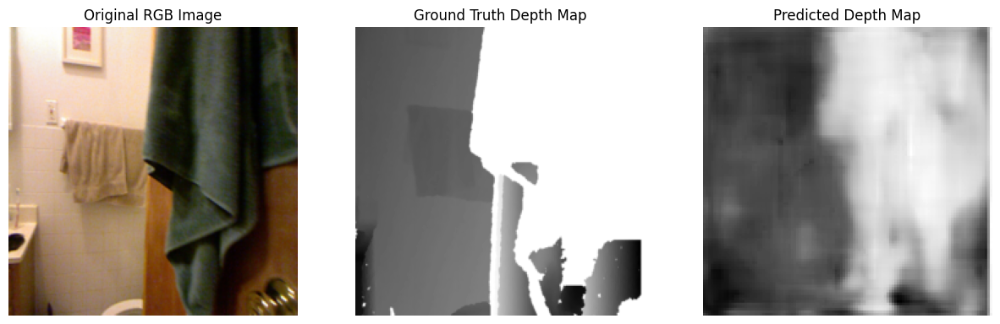

In [12]:
visualize_rgb_depth_prediction(Fast_depth_model, train_dataset, index=1)

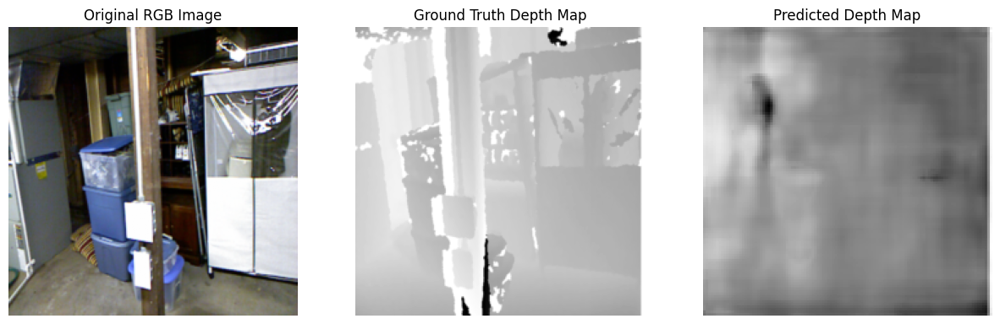

In [19]:
visualize_rgb_depth_prediction(Fast_depth_model, train_dataset, index=2)

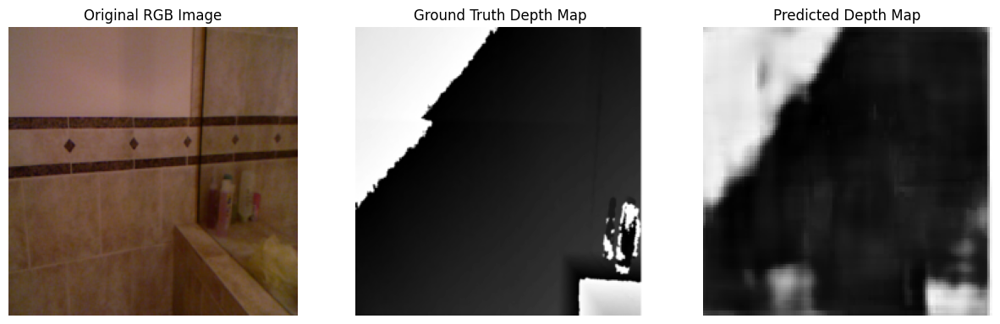

In [20]:
visualize_rgb_depth_prediction(Fast_depth_model, train_dataset, index=3)

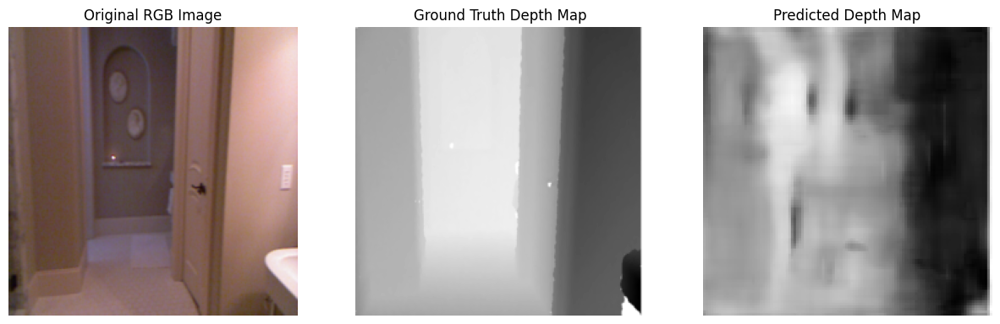

In [21]:
visualize_rgb_depth_prediction(Fast_depth_model, train_dataset, index=4)

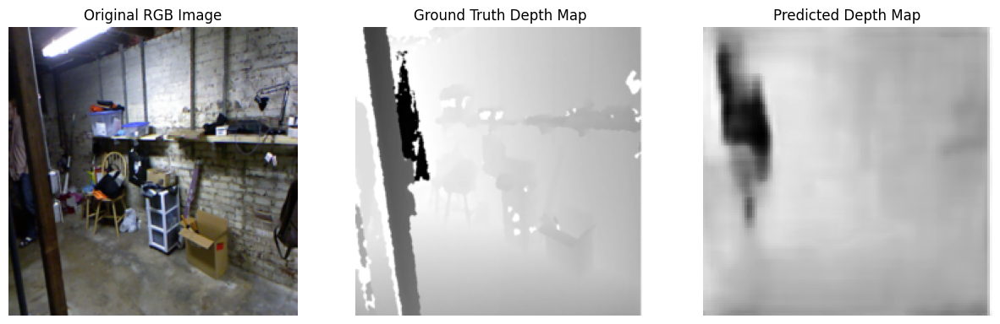

In [22]:
visualize_rgb_depth_prediction(Fast_depth_model, test_dataset, index=5)

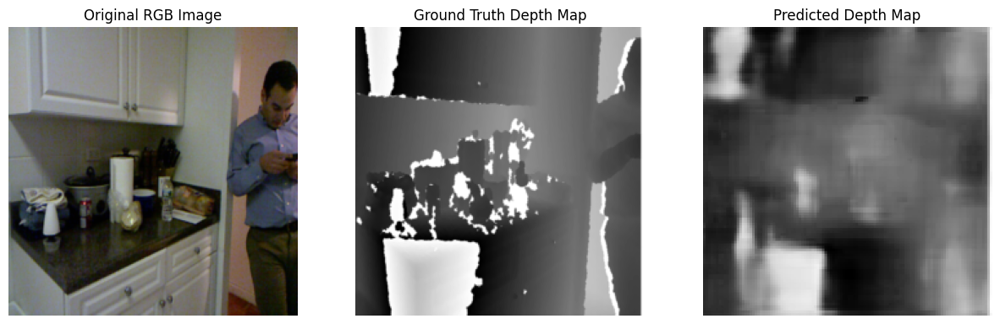

In [23]:
visualize_rgb_depth_prediction(Fast_depth_model, test_dataset, index=1)

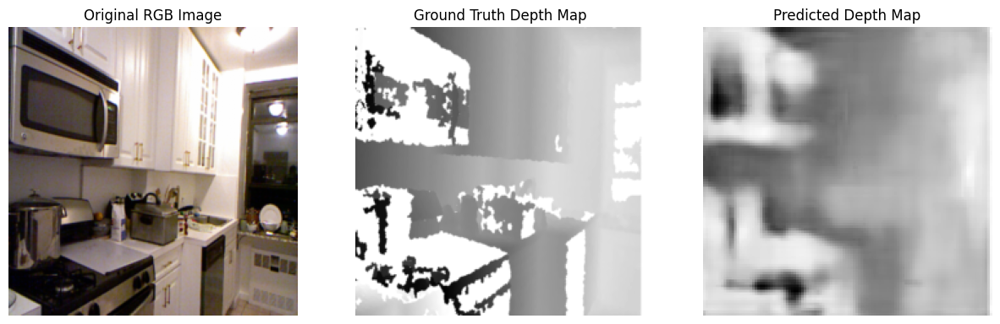

In [24]:
visualize_rgb_depth_prediction(Fast_depth_model, test_dataset, index=2)

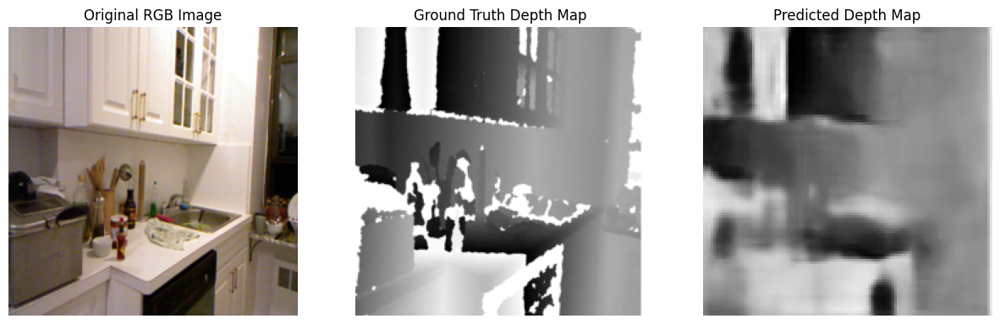

In [25]:
visualize_rgb_depth_prediction(Fast_depth_model, test_dataset, index=3)

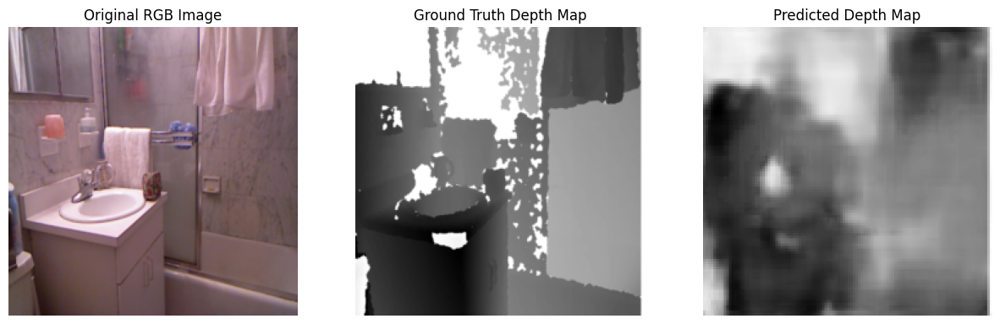

In [26]:
visualize_rgb_depth_prediction(Fast_depth_model, test_dataset, index=4)

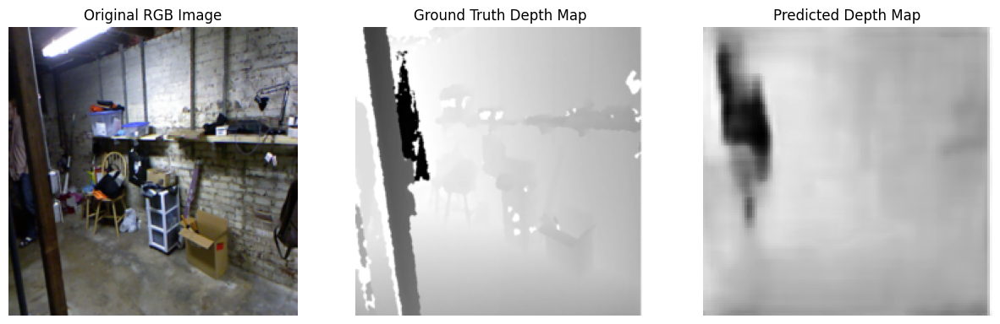

In [27]:
visualize_rgb_depth_prediction(Fast_depth_model, test_dataset, index=5)

# Redesigned Skip Connections with Attention

In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models

class AttentionBlock(nn.Module):
    def __init__(self, in_channels):
        super(AttentionBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, in_channels // 2, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(in_channels // 2)
        self.conv2 = nn.Conv2d(in_channels // 2, in_channels, kernel_size=1, bias=False)
        self.bn2 = nn.BatchNorm2d(in_channels)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        attention = F.avg_pool2d(x, x.size(2))  # Global average pooling
        attention = self.conv1(attention)
        attention = self.bn1(attention)
        attention = F.relu(attention, inplace=True)
        attention = self.conv2(attention)
        attention = self.bn2(attention)
        attention = self.sigmoid(attention)
        return x * attention

def depthwise(in_channels, kernel_size):
    padding = (kernel_size - 1) // 2
    return nn.Sequential(
        nn.Conv2d(in_channels, in_channels, kernel_size, stride=1, padding=padding, groups=in_channels, bias=False),
        nn.BatchNorm2d(in_channels),
        nn.ReLU(inplace=True),
    )

def pointwise(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
    )

class MobileNetSkipConcatDenseAttention(nn.Module):
    def __init__(self, decoder, output_size, pretrained=True):
        super(MobileNetSkipConcatDenseAttention, self).__init__()
        self.output_size = output_size
        mobilenet = models.mobilenet_v1(pretrained=pretrained)
        self.mobilenet = nn.Sequential(*list(mobilenet.features.children()))
        for param in self.mobilenet.parameters():
            param.requires_grad = False
        self.skip_channels = [ 128, 128, 256, 256, 512, 512, 512, 512,1024]
        self.attentions = nn.ModuleList([AttentionBlock(c) for c in self.skip_channels])
        self.decode_conv1 = nn.Sequential(
            depthwise(1024, 5),
            pointwise(1024, 512)
        )
        self.decode_conv2 = nn.Sequential(
            depthwise(512 + 512, 5),  
            pointwise(512 + 512, 256)
        )
        
        self.decode_conv3 = nn.Sequential(
            depthwise(256 + 256 + 512, 5),  
            pointwise(1024, 256)
        )
        self.decode_conv4 = nn.Sequential(
            depthwise(1024, 5), 
            pointwise(1024, 512)
        )
        self.decode_conv5 = nn.Sequential(
            depthwise(512, 5),  
            pointwise(512, 256)
        )
        self.decode_conv6 = nn.Conv2d(256, output_size, kernel_size=1, stride=1)

    def forward(self, x):
        skip_connections = []
        for i, layer in enumerate(self.mobilenet):
            x = layer(x)
            if i < len(self.attentions): 
                skip_connections.append(self.attentions[i](x))
   
        skip_connections = skip_connections[::-1]  
        x = self.decode_conv1(skip_connections[0])
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = torch.cat([x, F.interpolate(skip_connections[1], size=x.shape[2:], mode='nearest')], dim=1)
        x = self.decode_conv2(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = torch.cat([x, F.interpolate(skip_connections[2], size=x.shape[2:], mode='nearest'), 
                       F.interpolate(skip_connections[3], size=x.shape[2:], mode='nearest')], dim=1) 
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = torch.cat([x, F.interpolate(skip_connections[4], size=x.shape[2:], mode='nearest'),
                       F.interpolate(skip_connections[5], size=x.shape[2:], mode='nearest'),
                       F.interpolate(skip_connections[6], size=x.shape[2:], mode='nearest')], dim=1)
        x = self.decode_conv3(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = torch.cat([x, F.interpolate(skip_connections[7], size=x.shape[2:], mode='nearest'), 
                       F.interpolate(skip_connections[8], size=x.shape[2:], mode='nearest'), 
                       F.interpolate(skip_connections[9], size=x.shape[2:], mode='nearest')], dim=1)
        x = self.decode_conv4(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.decode_conv5(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.decode_conv6(x)
        return x


In [14]:
output_size = 1  
decoder_type = 'nnconv5dw'  
MobileNetSkipConcatDenseAttention_model = MobileNetSkipConcatDenseAttention(decoder=decoder_type, output_size=output_size, pretrained=True).cuda()

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 55.7MB/s]


In [ ]:
criterion = nn.MSELoss()
optimizer = optim.Adam(MobileNetSkipConcatDenseAttention.parameters(), lr=0.01)

Epoch 1/50
----------
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0005/r-1295148717.283402-2878060302.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0005/d-1295148717.204067-2873142853.pgm due to error: image file is truncated (1521 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0016/r-1300642307.704868-3712351616.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0016/d-1300642307.317504-3688445828.pgm due to error: image file is truncated (1905 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0002/r-1294890205.199444-1223062731.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0002/d-1294890205.013689-1210819291.pgm due to error: image file is truncated (1649 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0009/r-1300302696.365519-3475904749.ppm or /kaggle/input/thesis-final-nyu-depth/bath

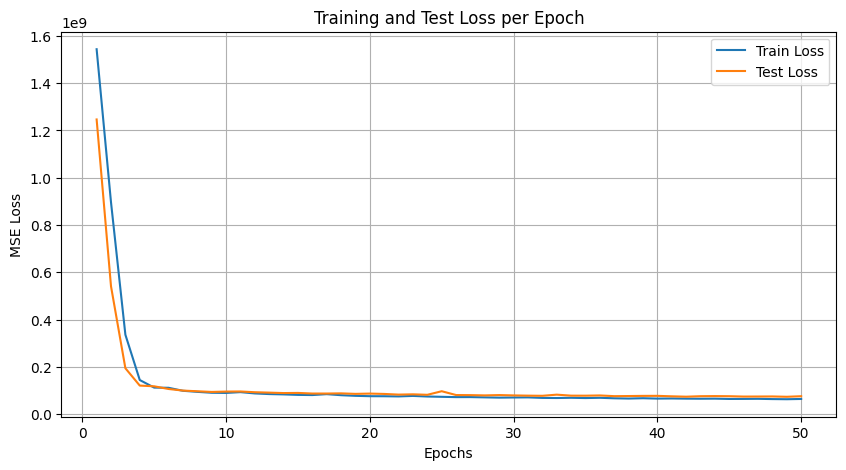

In [16]:
trained_model, train_losses, test_losses = train_model(MobileNetSkipConcatDenseAttention_model, train_loader, test_loader, criterion, optimizer, num_epochs=50)
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss')
plt.plot(range(1, len(test_losses) + 1), test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Training and Test Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

In [18]:
train_loss = evaluate_model(trained_model, train_loader, criterion)
test_loss = evaluate_model(trained_model, test_loader, criterion)
print(train_loss)
print(test_loss)

Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0016/r-1300642307.704868-3712351616.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0016/d-1300642307.317504-3688445828.pgm due to error: image file is truncated (1905 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0009/r-1300302696.365519-3475904749.ppm or /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0009/d-1300302696.316743-3472616410.pgm due to error: image file is truncated (1137 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0019a/r-1315330174.067203-1694676626.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0019a/d-1315330174.015262-1691157187.pgm due to error: image file is truncated (1393 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0002/r-1294890205.199444-1223062731.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_000

In [ ]:
model_path = "/kaggle/working/MobileNetSkipConcatDenseAttention_model.pth"
torch.save(trained_model.state_dict(), model_path)
# print(f"Model saved to {model_path}")

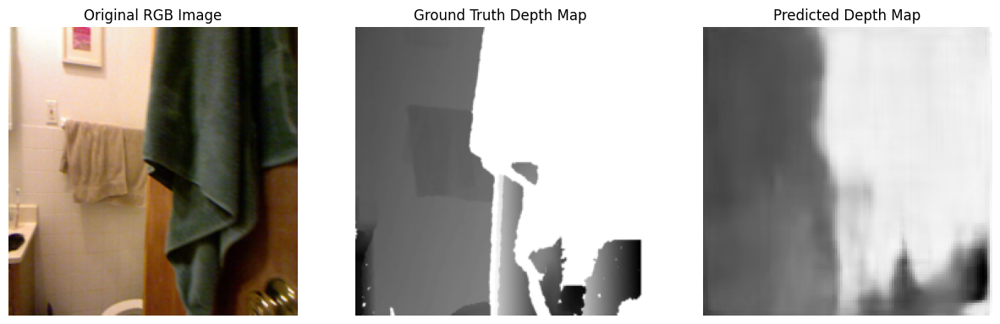

In [20]:
index = 1  
visualize_rgb_depth_prediction(trained_model, train_dataset, index)

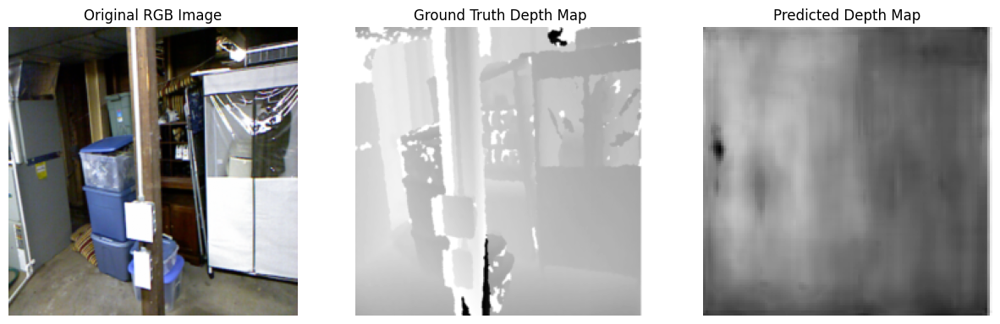

In [21]:
index = 2  
visualize_rgb_depth_prediction(trained_model, train_dataset, index)

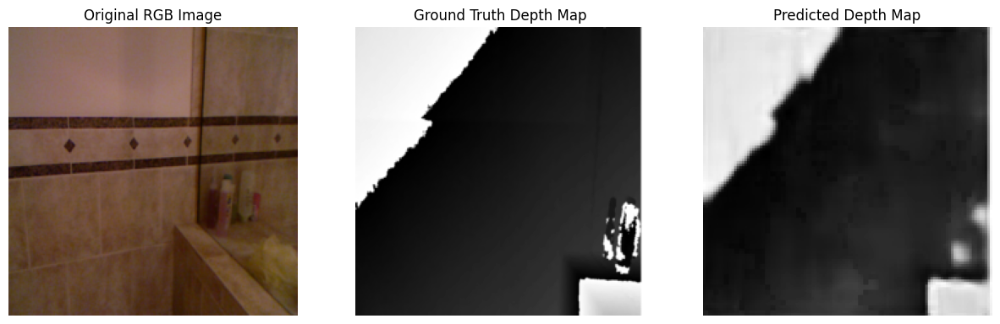

In [22]:
index = 3  
visualize_rgb_depth_prediction(trained_model, train_dataset, index)

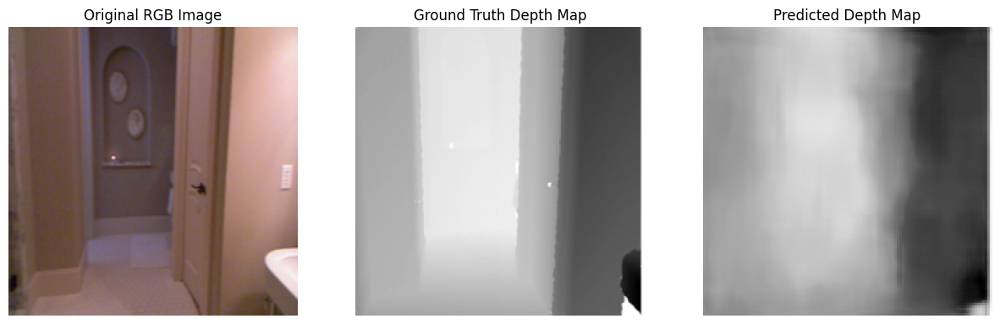

In [23]:
index = 4  
visualize_rgb_depth_prediction(trained_model, train_dataset, index)

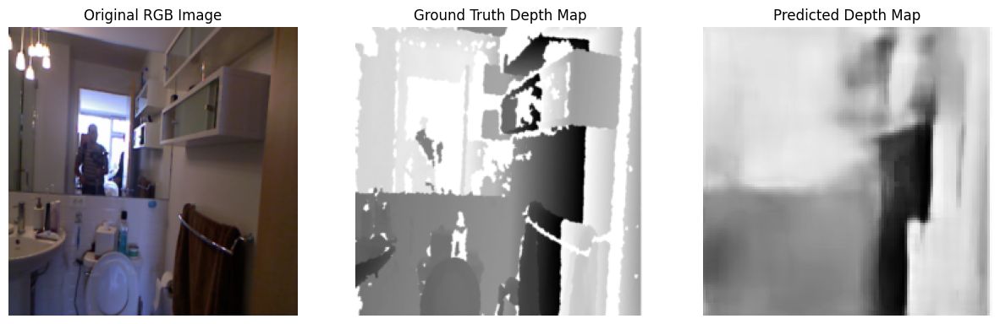

In [24]:
index = 5  
visualize_rgb_depth_prediction(trained_model, train_dataset, index)

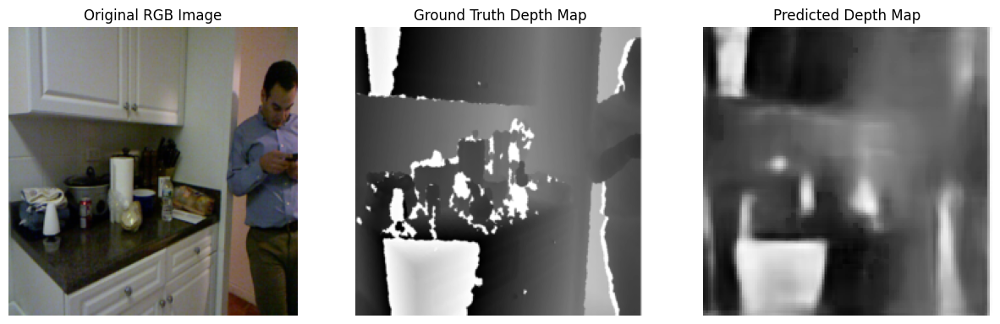

In [25]:
index = 1  
visualize_rgb_depth_prediction(trained_model, test_dataset, index)

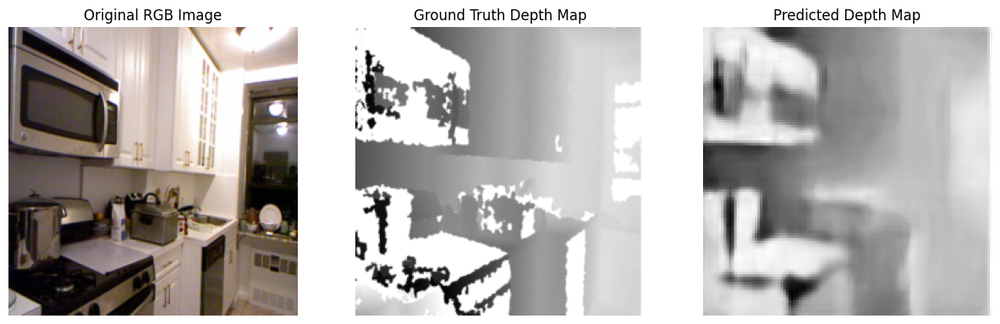

In [26]:
index = 2  
visualize_rgb_depth_prediction(trained_model, test_dataset, index)

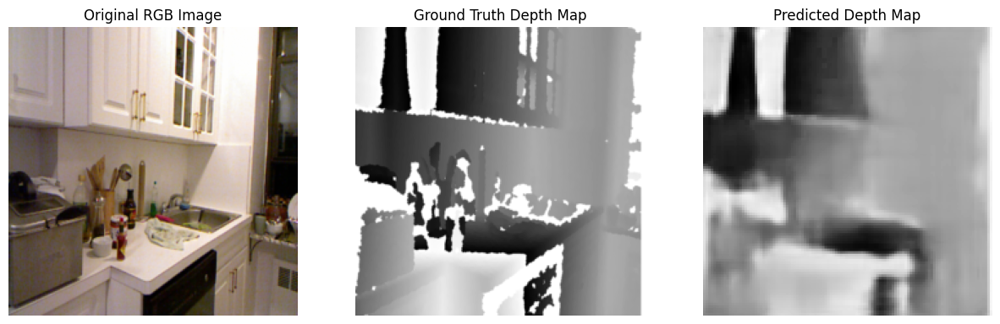

In [27]:
index = 3  
visualize_rgb_depth_prediction(trained_model, test_dataset, index)

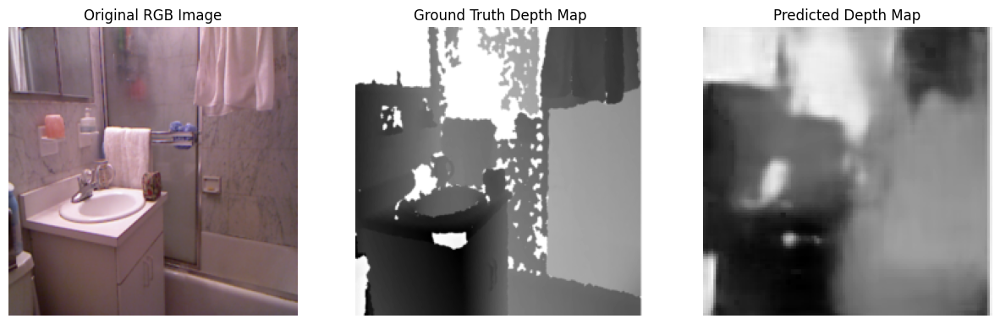

In [28]:
index = 4  
visualize_rgb_depth_prediction(trained_model, test_dataset, index)

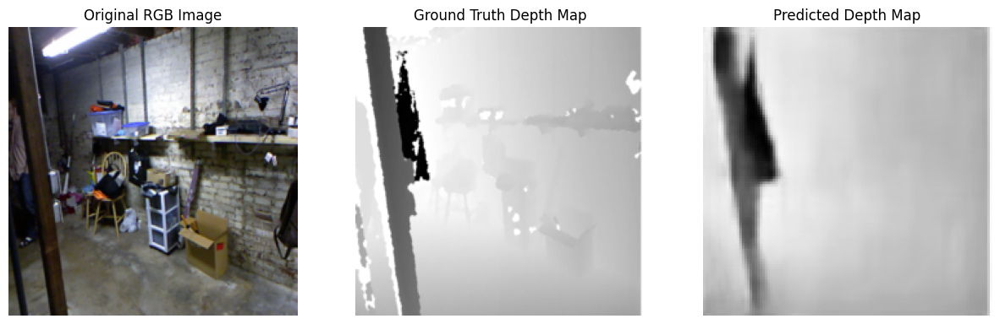

In [29]:
index = 5  
visualize_rgb_depth_prediction(trained_model, test_dataset, index)

# Model Metrics

In [ ]:
output_size = 1  
decoder_type = 'nnconv5dw'  
MobileNetAttention_model = MobileNetSkipConcatDenseAttention(decoder=decoder_type, output_size=output_size, pretrained=False).cuda()

model_path = '/kaggle/input/mobilenetskipconcatattention/pytorch/default/1/MobileNetSkipConcatAttention_model.pth'  
MobileNetAttention_model.load_state_dict(torch.load(model_path))
MobileNetAttention_model.eval()  # Set the model to evaluation mode

In [17]:
mse, rmse, mae, delta1 = compute_metrics(MobileNetAttention_model, train_loader)

Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0002/r-1294890205.199444-1223062731.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0002/d-1294890205.013689-1210819291.pgm due to error: image file is truncated (1649 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0009/r-1300302696.365519-3475904749.ppm or /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0009/d-1300302696.316743-3472616410.pgm due to error: image file is truncated (1137 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0016/r-1300642307.704868-3712351616.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0016/d-1300642307.317504-3688445828.pgm due to error: image file is truncated (1905 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0005/r-1295148717.283402-2878060302.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0005/

In [11]:
mse, rmse, mae, delta1 = compute_metrics(MobileNetAttention_model, test_loader)

Skipping file /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0013/r-1300633394.257325-1316796769.ppm or /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0013/d-1300633394.073547-1305340664.pgm due to error: image file is truncated (113 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/basements/basement_0001c/r-1316653687.842499-3408451313.ppm or /kaggle/input/thesis-final-nyu-depth/basements/basement_0001c/d-1316653687.835517-3408045567.pgm due to error: image file is truncated (241 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0008/r-1300200418.081829-3815940116.ppm or /kaggle/input/thesis-final-nyu-depth/bathrooms_1/bathroom_0008/d-1300200418.070522-3814948330.pgm due to error: image file is truncated (113 bytes not processed)
Skipping file /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_0013/r-1300200305.568814-1359937099.ppm or /kaggle/input/thesis-final-nyu-depth/kitchens_1/kitchen_00

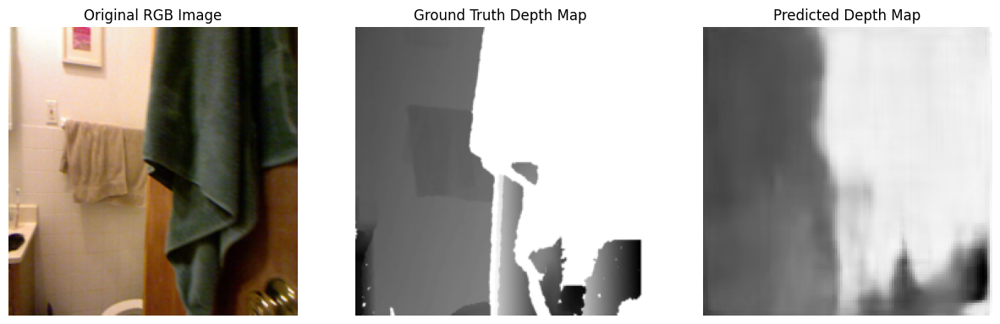

In [24]:
index = 1  
visualize_rgb_depth_prediction(MobileNetAttention_model, train_dataset, index)

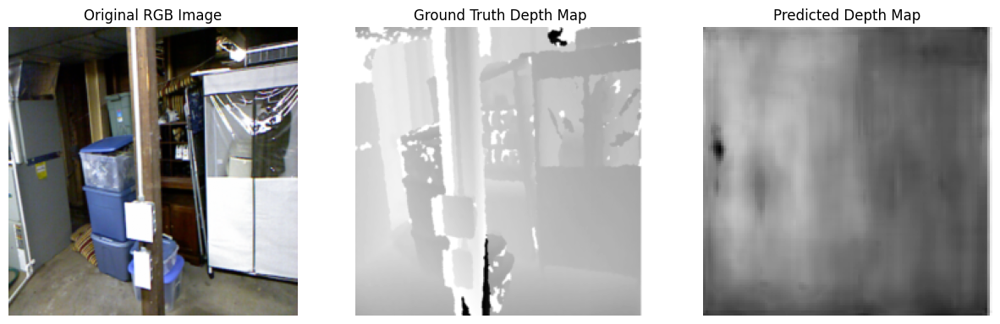

In [25]:
index = 2  
visualize_rgb_depth_prediction(MobileNetAttention_model, train_dataset, index)

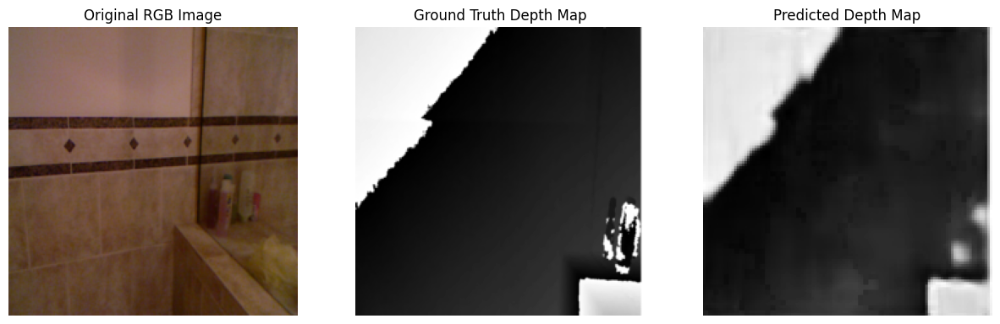

In [26]:
index = 3  
visualize_rgb_depth_prediction(MobileNetAttention_model, train_dataset, index)

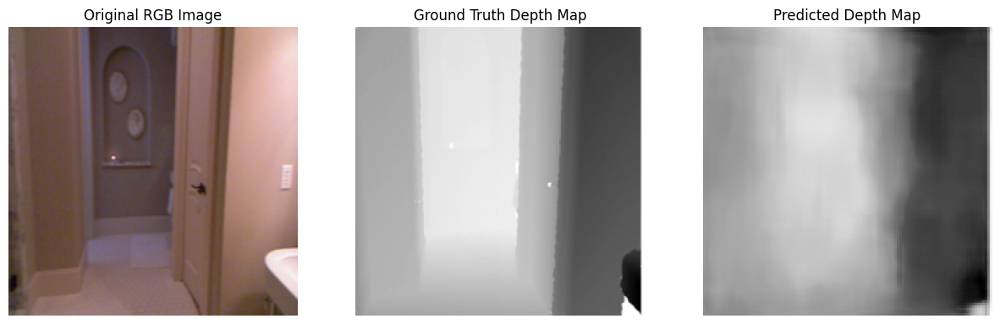

In [27]:
index = 4  
visualize_rgb_depth_prediction(MobileNetAttention_model, train_dataset, index)

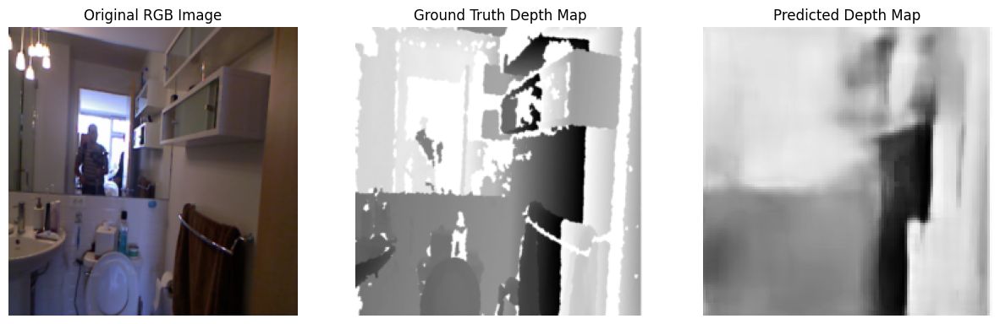

In [28]:
index = 5  
visualize_rgb_depth_prediction(MobileNetAttention_model, train_dataset, index)

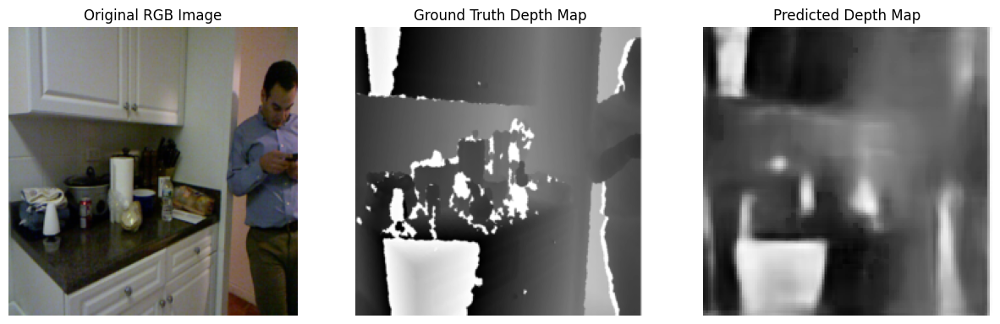

In [29]:

index = 1  
visualize_rgb_depth_prediction(MobileNetAttention_model, test_dataset, index)


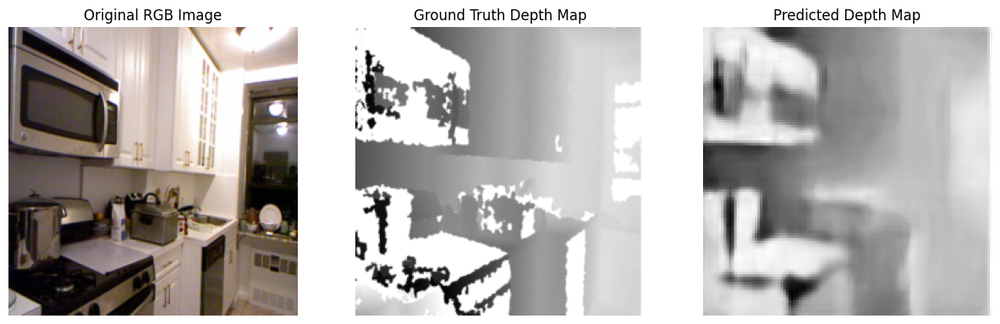

In [30]:

index = 2  
visualize_rgb_depth_prediction(MobileNetAttention_model, test_dataset, index)


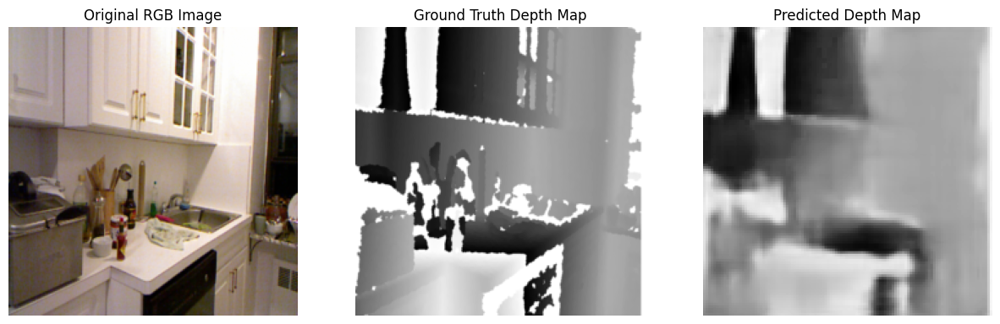

In [31]:

index = 3  
visualize_rgb_depth_prediction(MobileNetAttention_model, test_dataset, index)


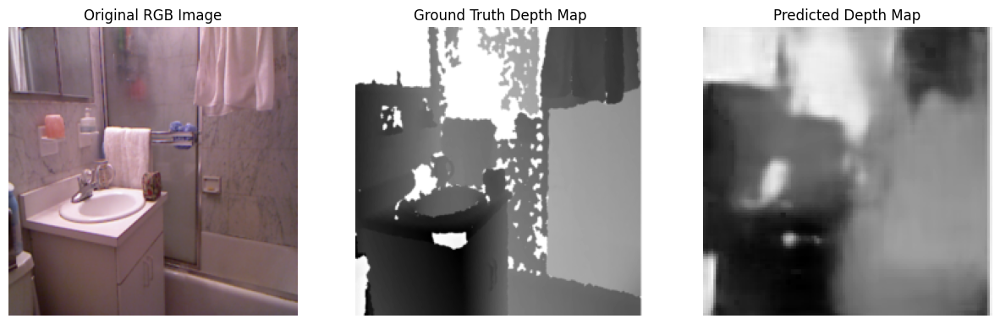

In [32]:

index = 4  
visualize_rgb_depth_prediction(MobileNetAttention_model, test_dataset, index)


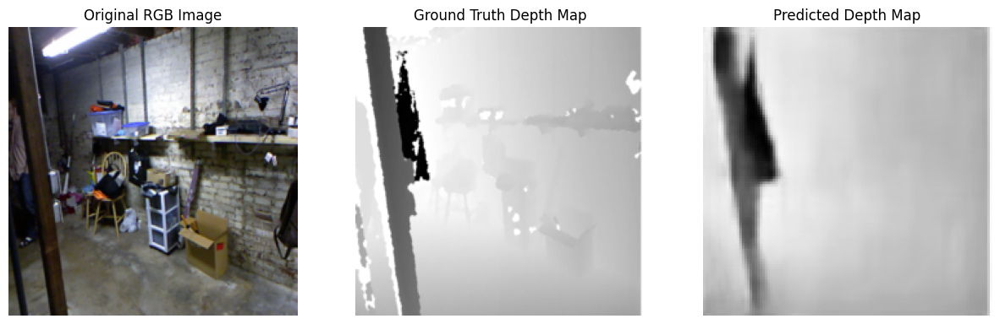

In [33]:

index = 5  
visualize_rgb_depth_prediction(MobileNetAttention_model, test_dataset, index)
